# Importing Modules and initializing general parameters

In [0]:
import torch 
import torch.nn as nn
import torch.functional as F

from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.optim as optim 
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import torchvision.utils as imutils

import pandas as pd
import numpy as np
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: {}".format(device))

print("PyTorch Version: {}".format(torch.__version__))

Device: cuda
PyTorch Version: 1.4.0


In [0]:
BASE_DIR = '.'
print("Path Valid:",os.path.exists(BASE_DIR))

Path Valid: True


In [0]:
DATASET_PATH = './cats_and_dogs_small'
print("Path Valid:",os.path.exists(DATASET_PATH))

Path Valid: True


# Cat-Dog Dataset Loading

In [0]:
train_dataset_path = os.path.join(DATASET_PATH,'train')
validation_dataset_path = os.path.join(DATASET_PATH,'validation')
test_dataset_path = os.path.join(DATASET_PATH,'test')
print("Path Valid:",os.path.exists(train_dataset_path))
print("Path Valid:",os.path.exists(validation_dataset_path))
print("Path Valid:",os.path.exists(test_dataset_path))

Path Valid: True
Path Valid: True
Path Valid: True


In [0]:
CLASSES = ['CAT','DOG']
CLASSES_INT = {'CAT':0,'DOG':1}

## Loading Cat Dog Dataset

In [0]:
# Making Transform for Dataset to make changes and converting to tensor while loading the dataset
# It can also be used for Data Augmentation

transform_train = transforms.Compose([
          transforms.Resize((224,224)),
          transforms.ToTensor(),
          transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_test_val = transforms.Compose([
          transforms.Resize((224,224)),
          transforms.ToTensor(),
          transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [0]:
# Creating Dataloader for Training Data from './cats_and_dogs_small/train' directory
train_dataset = ImageFolder(
    root = train_dataset_path,
    transform = transform_train
)

# Creating Dataloader for Validation Data from './cats_and_dogs_small/validation' directory
validation_dataset = ImageFolder(
    root = validation_dataset_path,
    transform = transform_test_val
)

# Creating Dataloader for Test Data from './cats_and_dogs_small/test' directory
test_dataset = ImageFolder(
    root = test_dataset_path,
    transform = transform_test_val
)


In [0]:
print("Train Dataset Length: ",len(train_dataset))
print("Validation Dataset Length: ",len(validation_dataset))
print("Test Dataset Length: ",len(test_dataset))

Train Dataset Length:  2000
Validation Dataset Length:  1000
Test Dataset Length:  1000


## Visualization Utility Functions

In [0]:

# Function to display any 3D Torch Tensor Image by Converting it into numpy
# Input Shape - > (3, W,H) 
# Numpy transposes is to (W,H,3) to display it using plt.imshow

def imshow(input_img,title=None, figsize=(5,5)):
  img = input_img.numpy()
  img = np.transpose(img,(1,2,0))
  img = np.multiply(img,[0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406]
  # img = np.transpose(img,(1,2,0))
  plt.figure(figsize=figsize)
  img = img*255
  plt.imshow(img.astype('uint8'))
  plt.axis('off')
  if title:
    plt.title(title)
  plt.show()

In [0]:
# Function to display a batch of photos using torchvision's make_grid function.
# It converts the batch of photos into a single grid of image of 3 channels
# it then sends the built grid to imshow function to display
def imshow_grid(input_tensor,figsize=(10,10),rows=8):
  img = imutils.make_grid(input_tensor,nrow=rows,padding=0, )
  imshow(img,figsize=figsize)

## DataLoader and Visualization

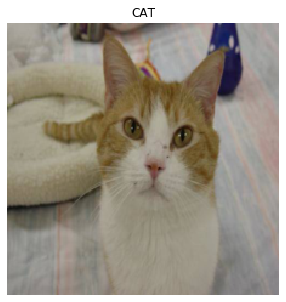

In [0]:
ind = np.random.randint(0,len(train_dataset))
imshow(train_dataset[ind][0],CLASSES[train_dataset[ind][1]])

In [0]:
# Creating a batch DataLoader or Generator using pytorch DataLoader Class
train_dataloader = DataLoader(train_dataset,batch_size=64,shuffle=True,num_workers=6)

In [0]:
data = iter(train_dataloader)

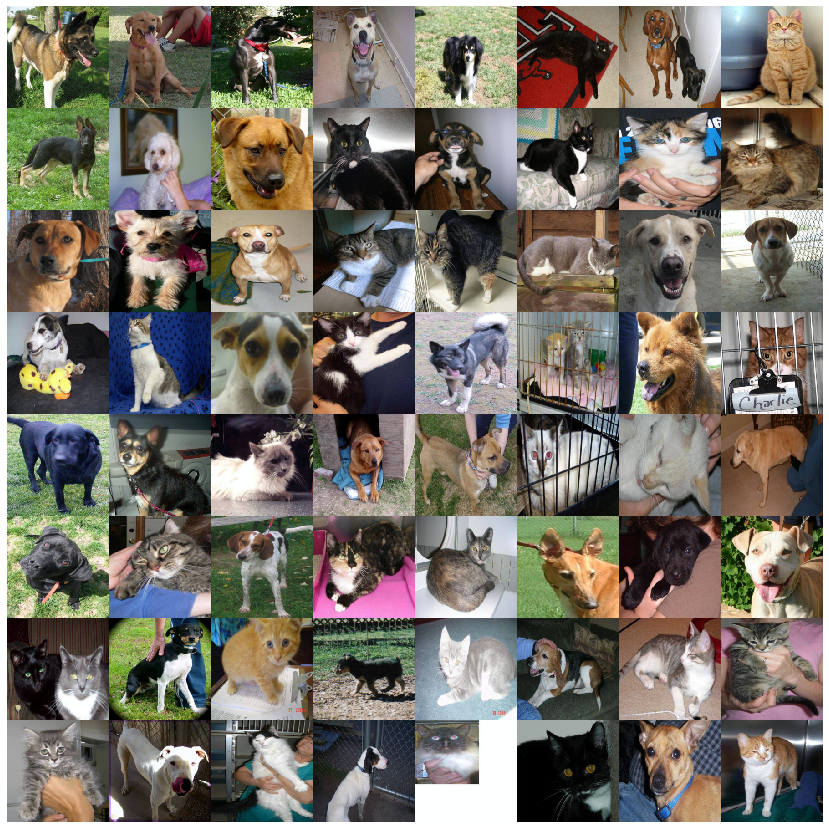

In [0]:
# showing a grid of 64 images (batch_size)
imshow_grid(data.next()[0],figsize=(15,15))

# Pre-trained VGG19

## Downloading VGG19 and pretrained weights

In [0]:
from torchsummary import summary

In [0]:
# Downloading VGG19 architecture with pre-trained weights using the below functions and 'pretrained=True'
from torchvision import models
model = models.vgg19(pretrained=True)

In [0]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [0]:
summary(model,(3,224,244),device="cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 244]           1,792
              ReLU-2         [-1, 64, 224, 244]               0
            Conv2d-3         [-1, 64, 224, 244]          36,928
              ReLU-4         [-1, 64, 224, 244]               0
         MaxPool2d-5         [-1, 64, 112, 122]               0
            Conv2d-6        [-1, 128, 112, 122]          73,856
              ReLU-7        [-1, 128, 112, 122]               0
            Conv2d-8        [-1, 128, 112, 122]         147,584
              ReLU-9        [-1, 128, 112, 122]               0
        MaxPool2d-10          [-1, 128, 56, 61]               0
           Conv2d-11          [-1, 256, 56, 61]         295,168
             ReLU-12          [-1, 256, 56, 61]               0
           Conv2d-13          [-1, 256, 56, 61]         590,080
             ReLU-14          [-1, 256,

## Modifying Classifier Layer

In [0]:
# Freezing all the layers of downloaded VGG19. Freezing means those layers will not be updated while training.
for param in model.parameters():
    param.requires_grad = False

In [0]:
# We need the feature extraction part i.e., CNN part of the VGG19 as freezed layer.
# The classification part of the model needs to updated to suit our application
# We need to classify an image into Cat or Dog.
# The complete classifier is updated as follows.
# The final output layer has only 1 neuron corresponding to 2 classes for binary classification.
# 0 -> CAT ; 1 -> DOG

# By Default, defining any new Layer is trainable
model.classifier  = nn.Sequential(
    nn.Linear(512*7*7, 4096),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(4096,1),
    nn.Sigmoid()
)

In [0]:
summary(model,(3,224,244),device="cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 244]           1,792
              ReLU-2         [-1, 64, 224, 244]               0
            Conv2d-3         [-1, 64, 224, 244]          36,928
              ReLU-4         [-1, 64, 224, 244]               0
         MaxPool2d-5         [-1, 64, 112, 122]               0
            Conv2d-6        [-1, 128, 112, 122]          73,856
              ReLU-7        [-1, 128, 112, 122]               0
            Conv2d-8        [-1, 128, 112, 122]         147,584
              ReLU-9        [-1, 128, 112, 122]               0
        MaxPool2d-10          [-1, 128, 56, 61]               0
           Conv2d-11          [-1, 256, 56, 61]         295,168
             ReLU-12          [-1, 256, 56, 61]               0
           Conv2d-13          [-1, 256, 56, 61]         590,080
             ReLU-14          [-1, 256,

In [0]:
# Counting Number of Trainable parameters in our new model
count = 0
for param in model.parameters():
  if param.requires_grad:
    count+=1
print(count)

# 4 refers to Linear-39, Linear-39 Bias, Linear-42, Linear-42 Bias

4


In [0]:
# Final Model
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

# Training

In [0]:
# Creating DataLoaders/ Batch_Generators for training,validation and Test Data
trainLoader = DataLoader(train_dataset,batch_size=16,shuffle=True, num_workers=20)
testLoader = DataLoader(test_dataset,batch_size=64,shuffle=False, num_workers=20)
validationLoader = DataLoader(validation_dataset,batch_size=64,shuffle=False, num_workers=20)

In [0]:
loss_fn = nn.BCELoss() # Loss Function to be used is Binary Cross Entropy Loss
model = model.to(device) # Moving the model to GPU
optimizer = optim.Adam(model.parameters(),lr=0.0001) # Defining optimizer as Adam with learning_rate=1e-4

In [0]:
from sklearn.metrics import accuracy_score

In [0]:
num_epochs = 10 # Number of Epochs

# metrics to store per epoch Loss and Accuracy for Training, Validation and Testing Data
metrics = {
    "loss":{'train':[],'val':[],'test':[]},
    "accuracy":{'train':[],'val':[],'test':[]},
}

for epoch in range(1,num_epochs+1):
  # metrics_temp used to calculate metrics for every individual epochs
  metrics_temp = {
    "loss":{'train':0,'val':0,'test':0},
    "accuracy":{'train':0,'val':0,'test':0},
    "count":{'train':0,'val':0,'test':0},
  }

  # Training the data

  # Putting the model in train mode so that DropOut works.
  model.train() 
  for i, data in tqdm(enumerate(trainLoader,0),total=len(trainLoader),unit='Step'):
    X,Y = data # Splitting data into input,target
    X,Y = X.to(device),Y.to(device) # Moving input and target to GPU
    Y = Y.unsqueeze(1) # adding extra dimension at axis=1
    output = model(X) # passing the input to model and Output is calculated for every image in batch
    loss = loss_fn(output,Y.float()) # loss is calcuated between predicted(output) and target(Y)
    model.zero_grad() # Setting the gradient to zero for the model
    optimizer.zero_grad() # Setting the gradient to zero for optimizer
    loss.backward() # Calculating gradient for every tensor which is used to calculate 'loss'
    optimizer.step() # Weights(parameters) are updated which are related to 'optimizer' i.e., model.classifier
    del X,Y,loss # X,Y and loss are deleted for saving memory

  # Evaluating the model for this epoch

  # Putting the model in evaluation mode which turns of Dropout and parameters are fixed for every model.
  model.eval()
  with torch.no_grad():
    # For Train Data
    for i, data in enumerate(trainLoader,0):
      X,Y = data
      X,Y = X.to(device),Y.to(device)
      Y = Y.unsqueeze(1)
      output = model(X)
      loss = loss_fn(output,Y.float())
      metrics_temp['loss']['train']+=loss.item()
      output = (output>=0.5).cpu().numpy().astype(int)
      Y = Y.cpu().numpy()
      metrics_temp['accuracy']['train']+=(Y==output).sum()
      metrics_temp['count']['train']+=len(Y)
      del X,Y,loss

    # For Validation Data
    for i, data in enumerate(validationLoader,0):
      X,Y = data
      X,Y = X.to(device),Y.to(device)
      Y = Y.unsqueeze(1)
      output = model(X)
      loss = loss_fn(output,Y.float())
      metrics_temp['loss']['val']+=loss.item()
      output = (output>=0.5).cpu().numpy().astype(int)
      Y = Y.cpu().numpy()
      metrics_temp['accuracy']['val']+=(Y==output).sum()
      metrics_temp['count']['val']+=len(Y)
      del X,Y,loss

    # For Test Data
    for i, data in enumerate(testLoader,0):
      X,Y = data
      X,Y = X.to(device),Y.to(device)
      Y = Y.unsqueeze(1)
      output = model(X)
      loss = loss_fn(output,Y.float())
      metrics_temp['loss']['test']+=loss.item()
      output = (output>=0.5).cpu().numpy().astype(int)
      Y = Y.cpu().numpy()
      metrics_temp['accuracy']['test']+=(Y==output).sum()
      metrics_temp['count']['test']+=len(Y)
      del X,Y,loss

  metrics['loss']['train'].append(metrics_temp['loss']['train']/metrics_temp['count']['train'])
  metrics['accuracy']['train'].append(metrics_temp['accuracy']['train']/metrics_temp['count']['train'])

  metrics['loss']['val'].append(metrics_temp['loss']['val']/metrics_temp['count']['val'])
  metrics['accuracy']['val'].append(metrics_temp['accuracy']['val']/metrics_temp['count']['val'])

  metrics['loss']['test'].append(metrics_temp['loss']['test']/metrics_temp['count']['test'])
  metrics['accuracy']['test'].append(metrics_temp['accuracy']['test']/metrics_temp['count']['test'])

  print("Epoch: {}/{} loss:{} | acc:{} | val_loss:{} | val_acc:{} | test_loss:{} | test_acc:{}".format(
      epoch,num_epochs,metrics['loss']['train'][-1],metrics['accuracy']['train'][-1],metrics['loss']['val'][-1],
      metrics['accuracy']['val'][-1],metrics['loss']['test'][-1],metrics['accuracy']['test'][-1]

  ))


Exception ignored in: <bound method tqdm.__del__ of  66%|██████▌   | 82/125 [02:08<00:05,  7.20Step/s]>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tqdm/_tqdm.py", line 931, in __del__
    self.close()
  File "/usr/local/lib/python3.6/dist-packages/tqdm/_tqdm.py", line 1133, in close
    self._decr_instances(self)
  File "/usr/local/lib/python3.6/dist-packages/tqdm/_tqdm.py", line 496, in _decr_instances
    cls.monitor.exit()
  File "/usr/local/lib/python3.6/dist-packages/tqdm/_monitor.py", line 52, in exit
    self.join()
  File "/usr/lib/python3.6/threading.py", line 1053, in join
    raise RuntimeError("cannot join current thread")
RuntimeError: cannot join current thread


Epoch: 1/10 loss:2.695236519567601e-08 | acc:1.0 | val_loss:0.0020114953856290186 | val_acc:0.985 | test_loss:0.003237523543277348 | test_acc:0.981



Epoch: 2/10 loss:6.443374686179837e-06 | acc:1.0 | val_loss:0.0026003949022101553 | val_acc:0.976 | test_loss:0.0031795382020100077 | test_acc:0.982



Epoch: 3/10 loss:7.764113281627515e-09 | acc:1.0 | val_loss:0.0016728500829559891 | val_acc:0.987 | test_loss:0.003291938321558974 | test_acc:0.985



Epoch: 4/10 loss:0.00017304832475996434 | acc:0.999 | val_loss:0.004329398925184254 | val_acc:0.975 | test_loss:0.003493728267028981 | test_acc:0.978



Epoch: 5/10 loss:2.860564376212782e-05 | acc:0.9995 | val_loss:0.0026715955235270313 | val_acc:0.987 | test_loss:0.0027224014100641156 | test_acc:0.986



Epoch: 6/10 loss:1.6193618836206626e-05 | acc:1.0 | val_loss:0.002921874440221117 | val_acc:0.982 | test_loss:0.0047572357732429925 | test_acc:0.981



Epoch: 7/10 loss:3.408757911937954e-09 | acc:1.0 | val_loss:0.003573070616170298 | val_acc:0.984 | test_loss:0.003984227373731599 | test_acc:0.979



Epoch: 8/10 loss:2.030285819465405e-10 | acc:1.0 | val_loss:0.003604824795445893 | val_acc:0.982 | test_loss:0.003980096512765335 | test_acc:0.981



Epoch: 9/10 loss:3.1851339432620307e-10 | acc:1.0 | val_loss:0.0035120948352850975 | val_acc:0.983 | test_loss:0.0041137046136136704 | test_acc:0.982



Epoch: 10/10 loss:7.264321943978303e-11 | acc:1.0 | val_loss:0.003312263472005725 | val_acc:0.983 | test_loss:0.00413415402891406 | test_acc:0.982


In [0]:
# Saving the model's weight
torch.save(model.state_dict(), os.path.join(BASE_DIR,'trained_weights.pth'))

# Metrics Plot

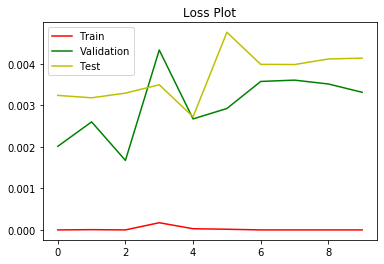

In [0]:
# Loss Plot vs Epoch
plt.plot(metrics['loss']['train'],'r')
plt.plot(metrics['loss']['val'],'g')
plt.plot(metrics['loss']['test'],'y')
plt.title('Loss Plot')
plt.legend(['Train','Validation','Test'])
plt.show()

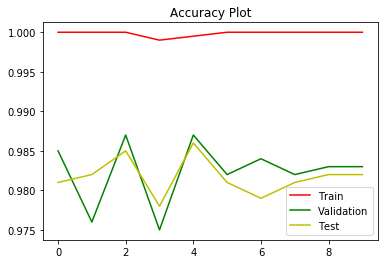

In [0]:
# Accuracy Plot vs Epoch
plt.plot(metrics['accuracy']['train'],'r')
plt.plot(metrics['accuracy']['val'],'g')
plt.plot(metrics['accuracy']['test'],'y')
plt.title('Accuracy Plot')
plt.legend(['Train','Validation','Test'])
plt.show()

# Inference

In [0]:
# Function to predict the whether the input image is Class or Dog using the Trained CNN Classifier
def predict(image):
  image = image.unsqueeze(0) # Adding extra dimension in the beggining as batch_size
  image = image.to(device) # moving to GPU
  output = model(image) # Getting output from the trained model
  output = (output>=0.5).detach().cpu().numpy().astype(int) # if probabilty is >=0.5 then it is a Dog otherwise a Cat
  return output[0][0]

In [0]:
model = model.eval()

Inference on Training Data

Actual: CAT
Predicted: CAT


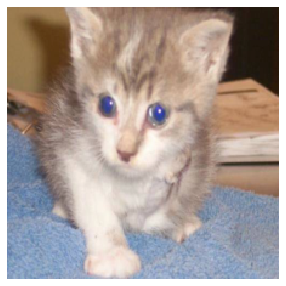

In [0]:
ind = np.random.randint(0,len(train_dataset))
print("Actual:",CLASSES[train_dataset[ind][1]])
print("Predicted:",CLASSES[predict(train_dataset[ind][0])])
imshow(train_dataset[ind][0])

Inference on Validation Data

Actual: CAT
Predicted: CAT


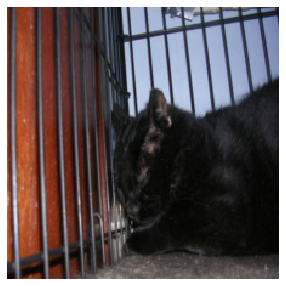

In [0]:
ind = np.random.randint(0,len(validation_dataset))
print("Actual:",CLASSES[validation_dataset[ind][1]])
print("Predicted:",CLASSES[predict(validation_dataset[ind][0])])
imshow(validation_dataset[ind][0])

Inference on Test Data

Actual: DOG
Predicted: DOG


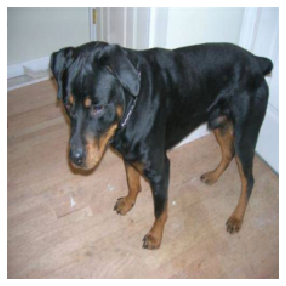

In [100]:
ind = np.random.randint(0,len(test_dataset))
print("Actual:",CLASSES[test_dataset[ind][1]])
print("Predicted:",CLASSES[predict(test_dataset[ind][0])])
imshow(test_dataset[ind][0])

# Filter Visualization

In [98]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [0]:
def imshow_f(input_img,title=None, figsize=(5,5)):
  img = input_img.numpy()
  img = np.transpose(img,(1,2,0))
  plt.figure(figsize=figsize)
  img = img*255
  plt.imshow(img.astype('uint8'))
  plt.axis('off')
  if title:
    plt.title(title)
  plt.show()

In [0]:
def imshow_grid_f(input_tensor,figsize=(10,10),rows=8):
  L = input_tensor.size(1)
  img = imutils.make_grid(input_tensor,nrow=rows,padding=1)
  for i in range(L):
    imshow_f(img[i],figsize=figsize)
    break

0


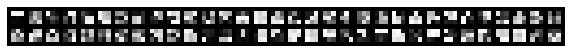

2


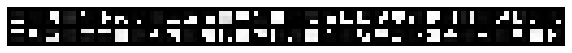

5


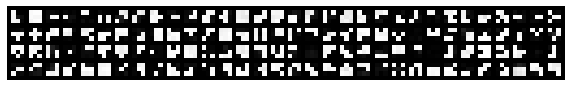

7


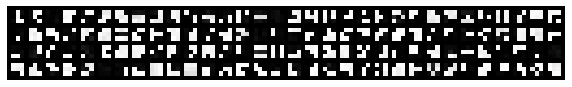

10


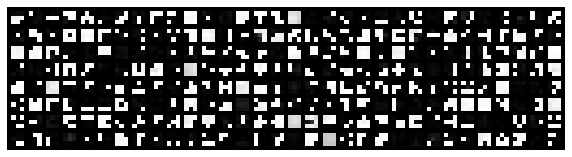

12


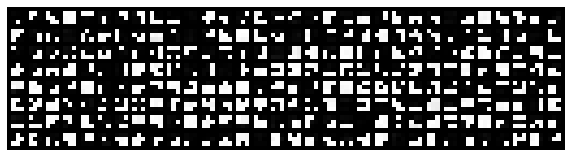

14


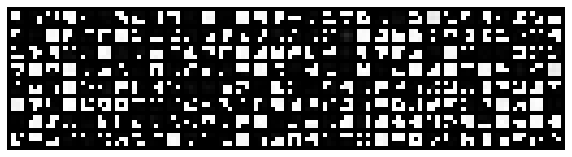

16


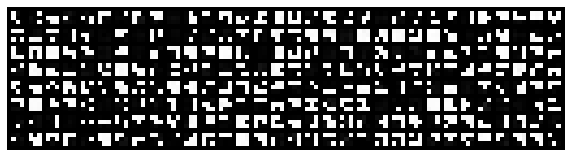

19


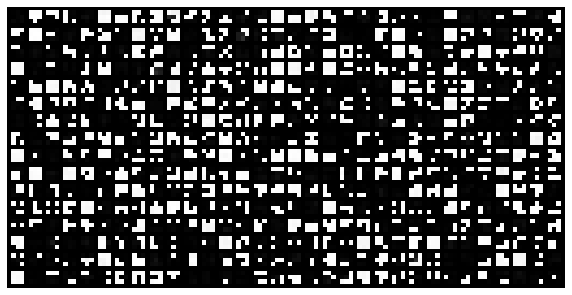

21


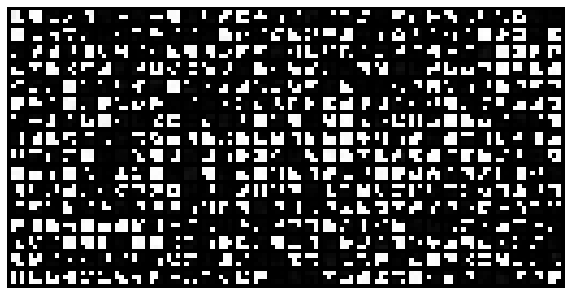

23


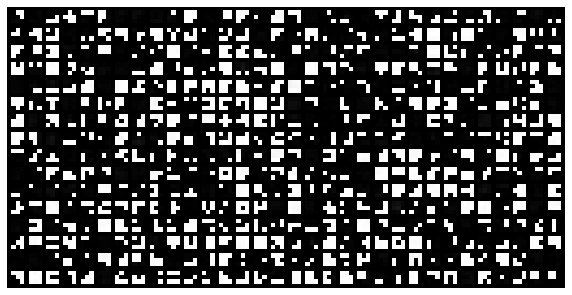

25


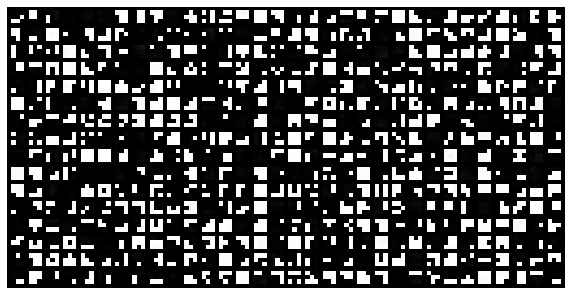

28


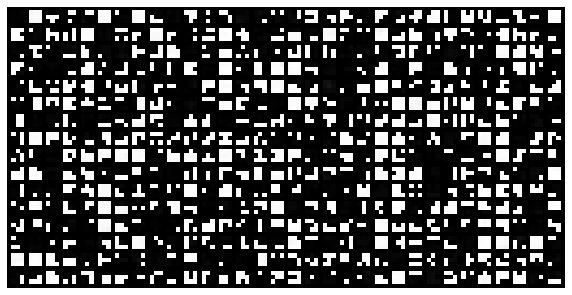

30


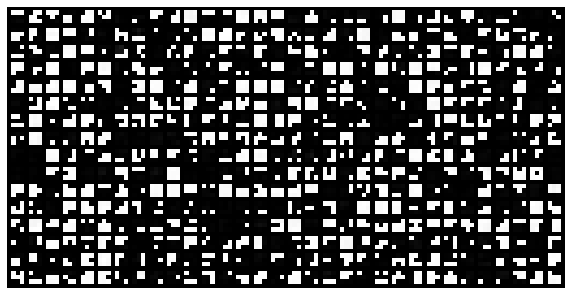

32


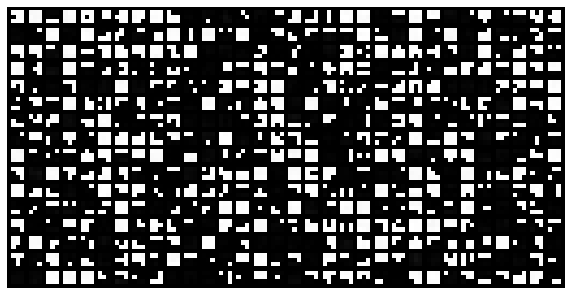

34


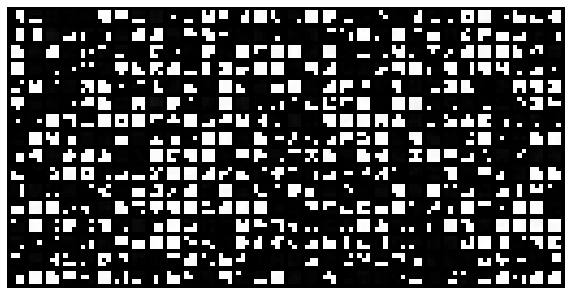

In [124]:
for i in range(len(model.features)):
  if(isinstance(model.features[i],nn.Conv2d)):
    print(i)
    imshow_grid_f(model.features[i].weight.cpu(),rows=32)

In [0]:
random_image = torch.rand((1,3,224,244),device=device)

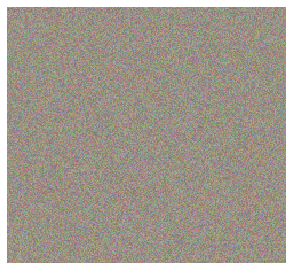

In [164]:
imshow(random_image[0].cpu())

In [0]:
def imshow_grid_f2(input_tensor,figsize=(10,10),rows=8):
  L = input_tensor.size(1)
  input_tensor = input_tensor.squeeze()
  input_tensor = input_tensor.unsqueeze(1)
  input_tensor = torch.cat([input_tensor,input_tensor,input_tensor],dim=1)
  img = imutils.make_grid(input_tensor,nrow=rows,padding=5)
  imshow_f(img,figsize=figsize)

In [0]:
feature_map = []
for i in range(len(model.features)):
  if(isinstance(model.features[i],nn.Conv2d)):
    random_image = model.features[i](random_image)
    feature_map.append(random_image)
  else:
    random_image = model.features[i](random_image)

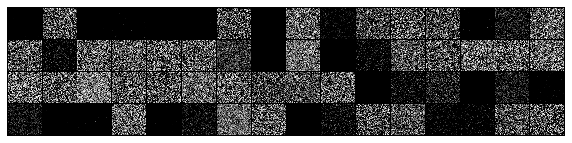

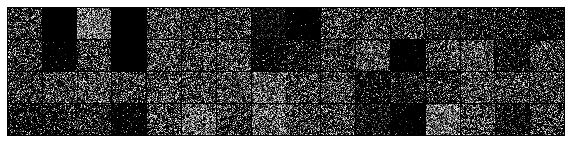

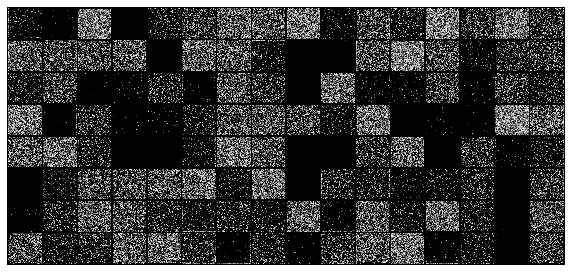

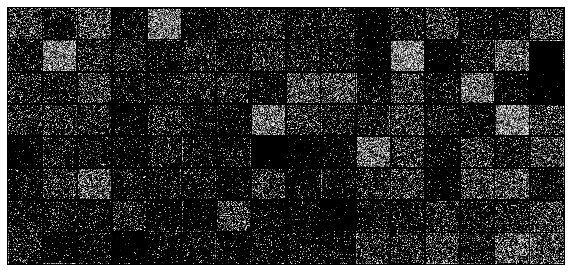

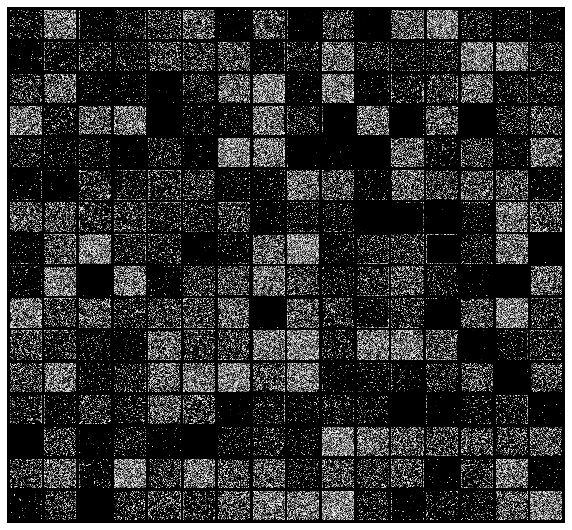

...

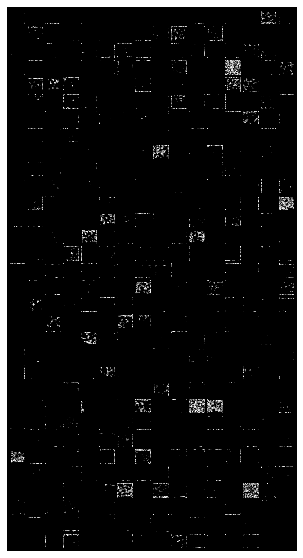

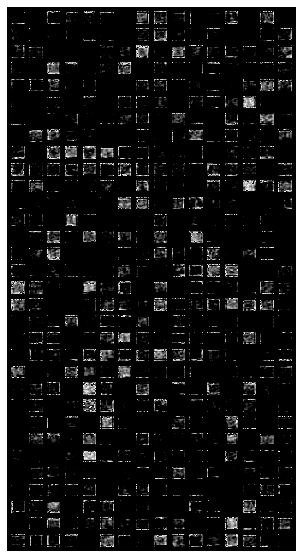

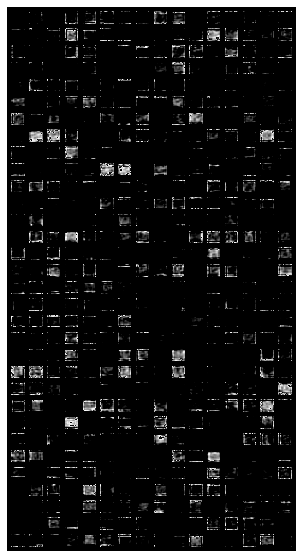

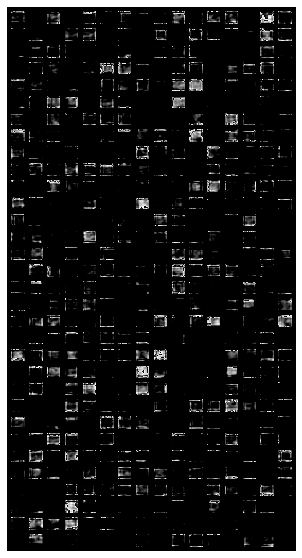

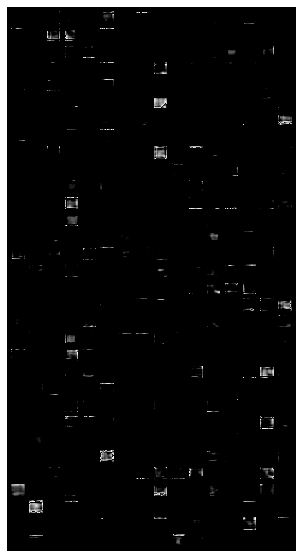

In [173]:
for feature in feature_map:
  # print(feature.shape)
  imshow_grid_f2(feature.cpu(),rows=16)

# Feature Map Visualization

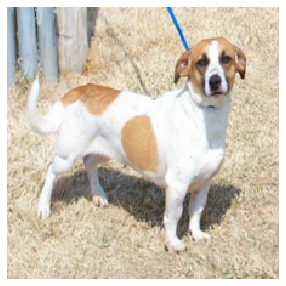

In [186]:
imshow(train_dataset[1209][0])

In [0]:
random_image = train_dataset[1209][0].unsqueeze(0).to(device)
feature_map = []
for i in range(len(model.features)):
  if(isinstance(model.features[i],nn.Conv2d)):
    random_image = model.features[i](random_image)
    feature_map.append(random_image)
  else:
    random_image = model.features[i](random_image)

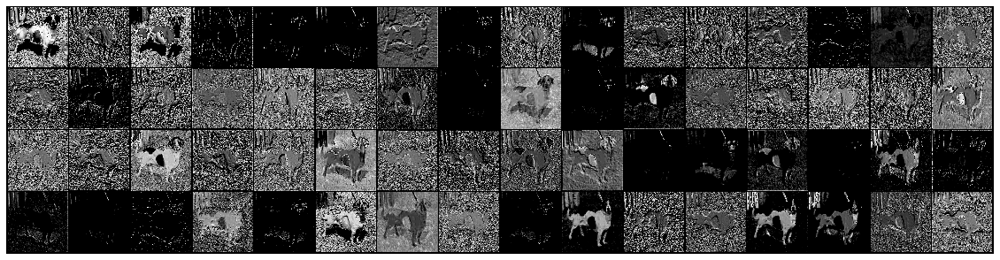

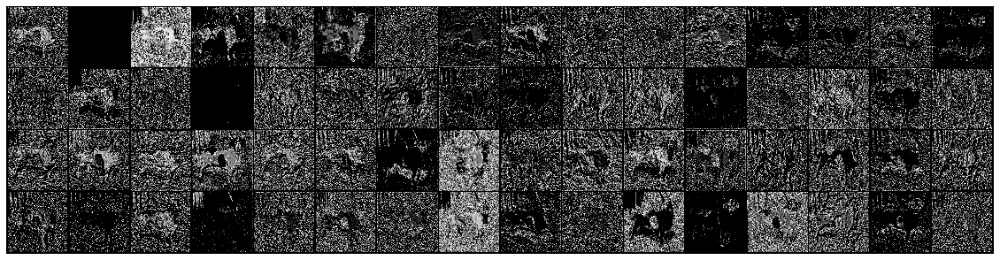

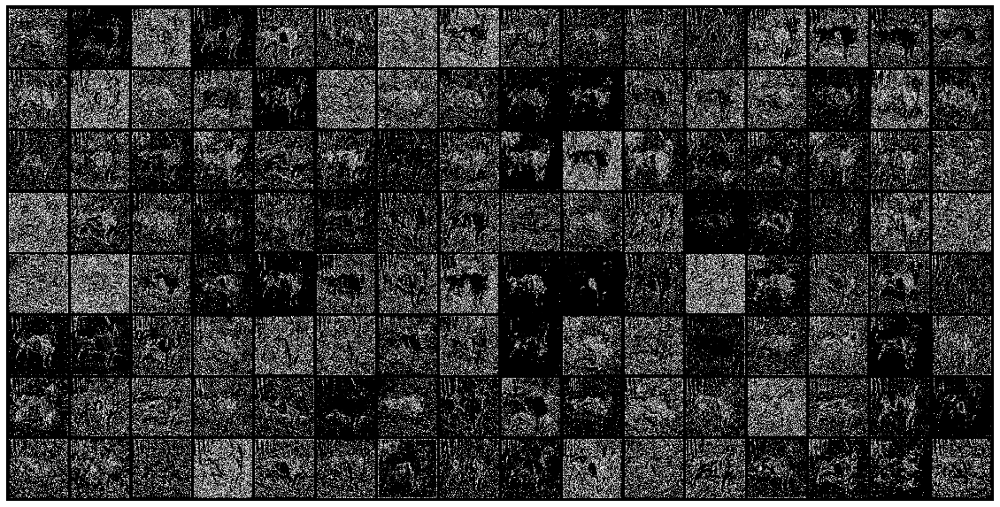

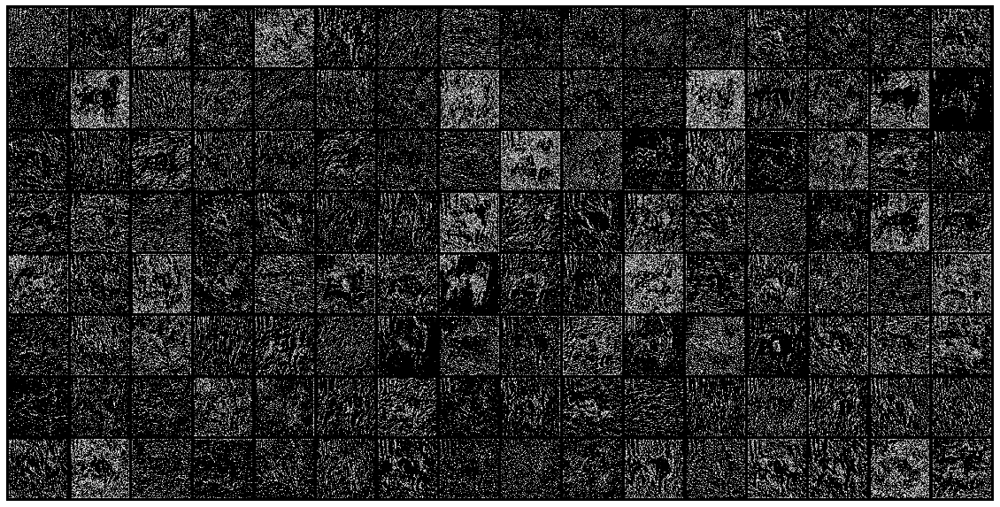

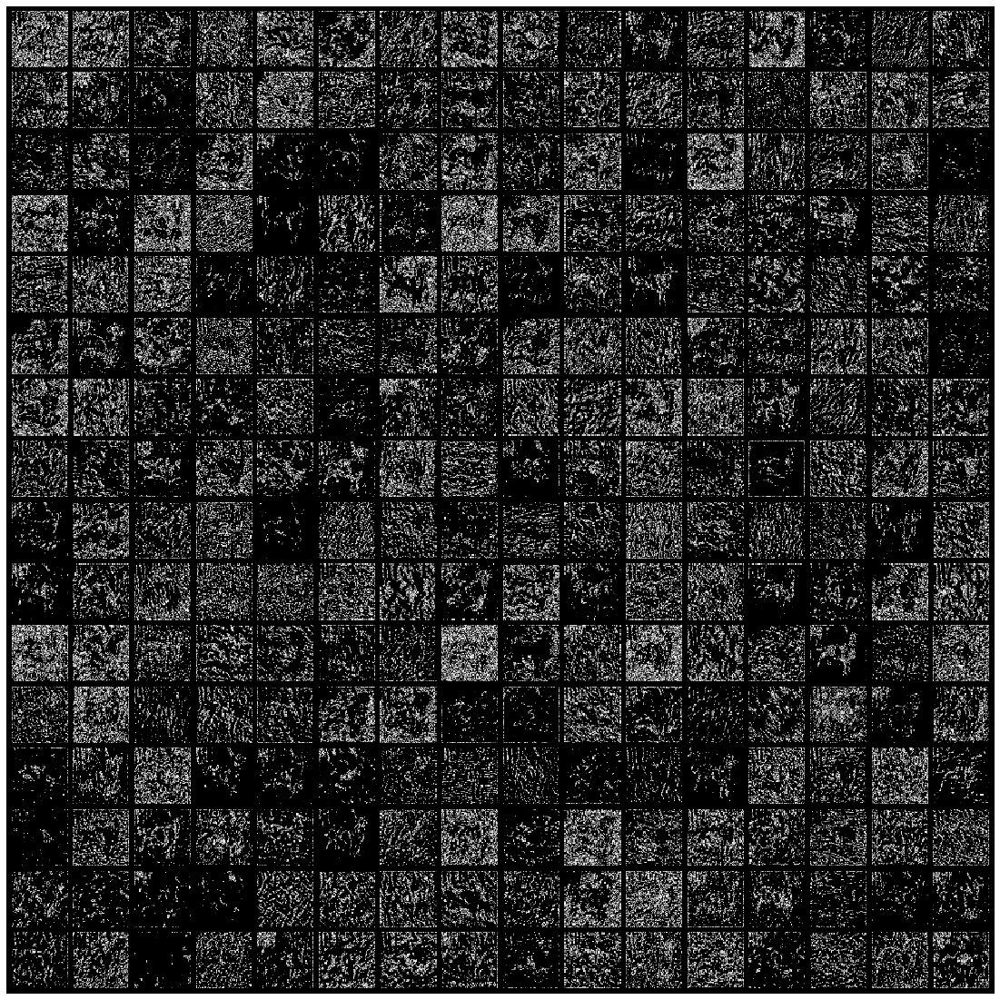

...

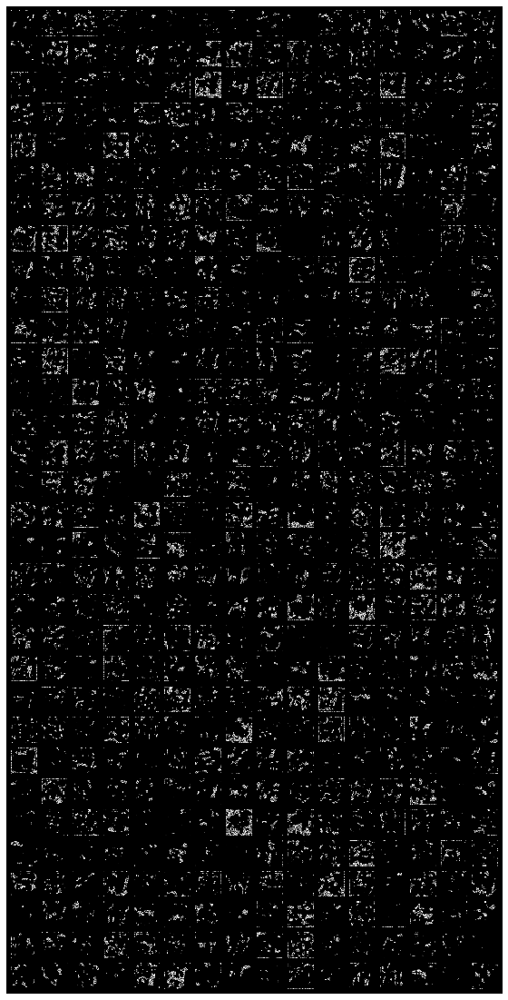

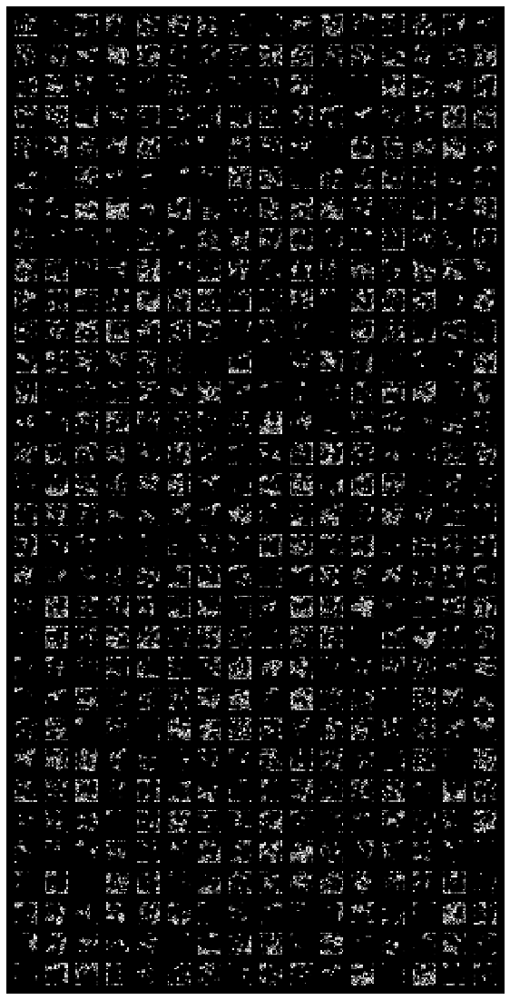

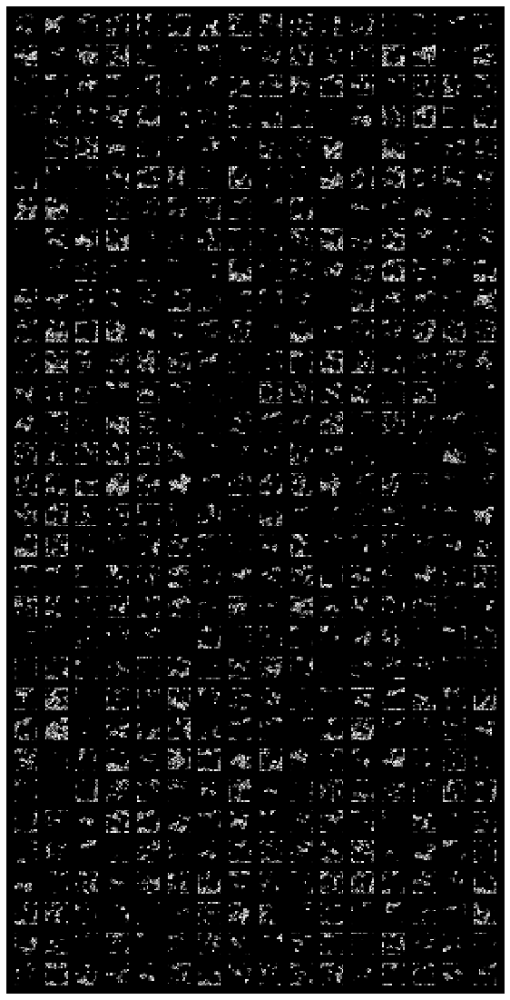

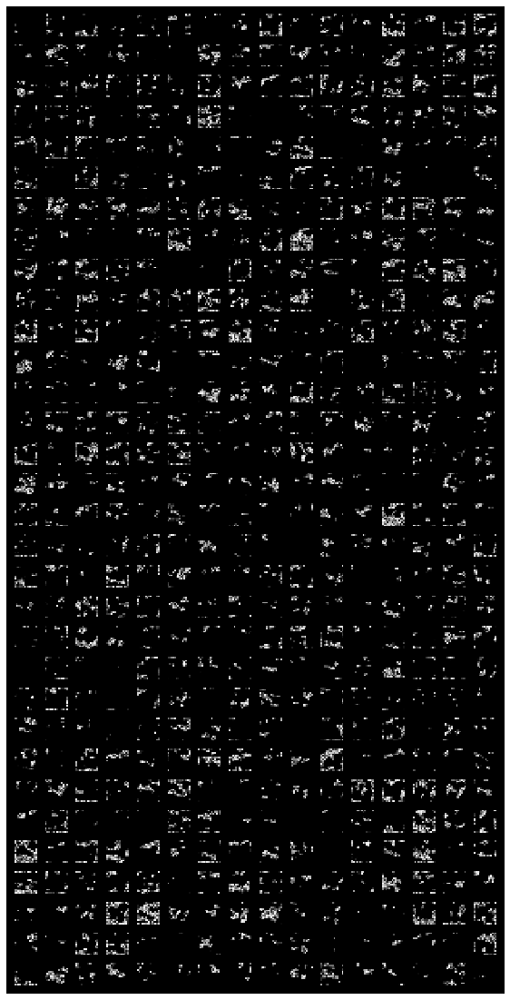

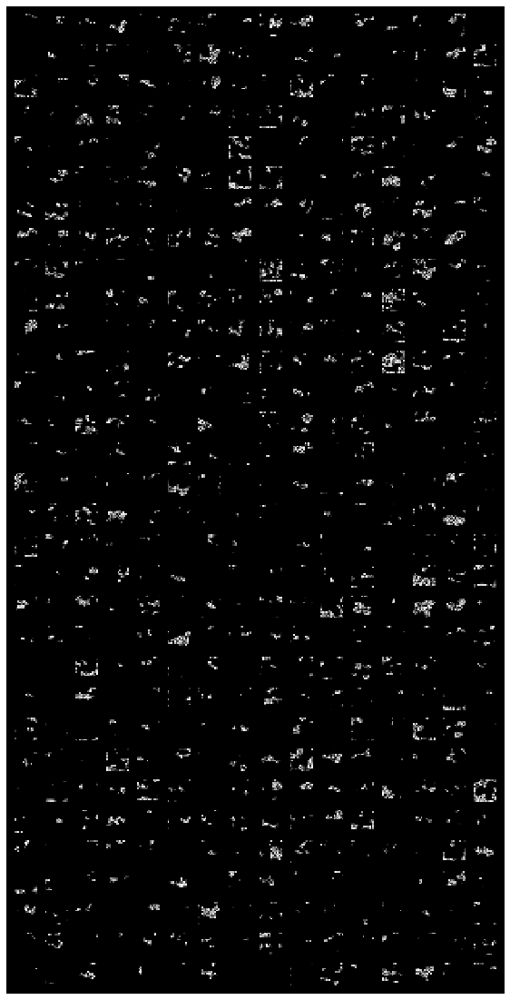

In [184]:
for feature in feature_map:
  # print(feature.shape)
  imshow_grid_f2(feature.cpu(),rows=16,figsize=(20,20))